In [5]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

slotcodes = {
    0 : 'QB', 1 : 'QB',
    2 : 'RB', 3 : 'RB',
    4 : 'WR', 5 : 'WR',
    6 : 'TE', 7 : 'TE',
    16: 'D/ST',
    17: 'K',
    20: 'Bench',
    21: 'IR',
    23: 'Flex'
}

def get_matchups(league_id, season, week, swid='', espn=''):
    ''' 
    Pull full JSON of matchup data from ESPN API for a particular week.
    '''
    
    url = 'https://fantasy.espn.com/apis/v3/games/ffl/seasons/' + \
      str(season) + '/segments/0/leagues/' + str(league_id)

    r = requests.get(url + '?view=mMatchup&view=mMatchupScore',
                     params={'scoringPeriodId': week, 'matchupPeriodId': week},
                     cookies={"SWID": swid, "espn_s2": espn})
    return r.json()

In [7]:
def get_slates(json):
    '''
    Constructs week team slates with slotted position, 
    position, and points (actual and ESPN projected),
    given full matchup info (`get_matchups`)
    '''
    
    slates = {}

    for team in d['teams']:
        slate = []
        for p in team['roster']['entries']:
            # get name
            name  = p['playerPoolEntry']['player']['fullName']

            # get actual lineup slot
            slotid = p['lineupSlotId']
            slot = slotcodes[slotid]

            # get projected and actual scores
            act, proj = 0, 0
            for stat in p['playerPoolEntry']['player']['stats']:
                if stat['scoringPeriodId'] != week:
                    continue
                if stat['statSourceId'] == 0:
                    act = stat['appliedTotal']
                elif stat['statSourceId'] == 1:
                    proj = stat['appliedTotal']
                else:
                    print('Error')

            # get type of player
            pos = 'Unk'
            ess = p['playerPoolEntry']['player']['eligibleSlots']
            if 0 in ess: pos = 'QB'
            elif 2 in ess: pos = 'RB'
            elif 4 in ess: pos = 'WR'
            elif 6 in ess: pos = 'TE'
            elif 16 in ess: pos = 'D/ST'
            elif 17 in ess: pos = 'K'

            slate.append([name, slotid, slot, pos, act, proj])

        slate = pd.DataFrame(slate, columns=['Name', 'SlotID', 'Slot', 'Pos', 'Actual', 'Proj'])
        slates[team['id']] = slate

    return slates

In [11]:
def compute_pts(slates, posns, struc):
    '''
    Given slates (`get_slates`), compute total roster pts:
    actual, optimal, and using ESPN projections
    
    Parameters
    --------------
    slates : `dict` of `DataFrames`
        (from `get_slates`)
    posns : `list`
        roster positions, e.g. ['QB','RB', 'WR', 'TE']
    struc : `list`
        slots per position, e.g. [1,2,2,1]
        
    * This is not flexible enough to handle "weird" leagues
    like 6 Flex slots with constraints on # total RB/WR
    
    Returns
    --------------
    `dict` of `dict`s with actual, ESPN, optimal points
    '''
    
    data = {}
    for tmid, slate in slates.items():
        pts = {'opts': 0, 'epts': 0, 'apts': 0}

        # ACTUAL STARTERS
        pts['apts'] = slate.query('Slot not in ["Bench", "IR"]').filter(['Actual']).sum().values[0]

        # OPTIMAL and ESPNPROJ STARTERS
        for method, cat in [('Actual', 'opts'), ('Proj', 'epts')]:
            actflex = -100  # actual pts scored by flex
            proflex = -100  # "proj" pts scored by flex
            for pos, num in zip(posns, struc):
                # actual points, sorted by either actual or proj outcome
                t = slate.query('Pos == @pos').sort_values(by=method, ascending=False).filter(['Actual']).values[:,0]

                # projected points, sorted by either actual or proj outcome
                t2 = slate.query('Pos == @pos').sort_values(by=method, ascending=False).filter(['Proj']).values[:,0]

                # sum up points
                pts[cat] += t[:num].sum()

                # set the next best as flex
                if pos in ['RB', 'WR', 'TE'] and len(t) > num:
                    fn = t[num] if method=='Actual' else t2[num]
                    if fn > proflex:
                        actflex = t[num]
                        proflex = fn

            pts[cat] += actflex
        
        data[tmid] = pts
        
    return data

In [13]:
def get_teamnames(league_id, season, week, swid='', espn=''):
    url = 'https://fantasy.espn.com/apis/v3/games/ffl/seasons/' + \
      str(season) + '/segments/0/leagues/' + str(league_id)
    
    r = requests.get(url + '?view=mTeam',
                  params={'scoringPeriodId': week},
                  cookies={"SWID": swid, "espn_s2": espn})
    d = r.json()
    
    tm_names = {tm['id']: tm['location'].strip() + ' ' + tm['nickname'].strip() \
                for tm in d['teams']}
    
    return tm_names

In [19]:
def plot_week(d, data, week, tm_names, nummatchups=5, 
              minx=70, maxx=200, legend=4):
    fig, ax = plt.subplots(1,1, figsize=(12,8))

    # hardcoded plot adjustments
    dif, offset = 5, 2
    
    # for y-axis tick labels
    tmlist, tmticks, tmbold = [], [], []

    cury = 0
    for g in d['schedule'][:nummatchups]:
        aid, anm = -1, ''
        hid, hnm = -1, ''
        try:
            aid = g['away']['teamId']
            anm = tm_names[aid]
            hid = g['home']['teamId']
            hnm = tm_names[hid]
        except:
            continue

        tmlist.append(anm)
        tmlist.append(hnm)

        if data[aid]['apts'] > data[hid]['apts']:
            tmbold.extend([1,0])
        else:
            tmbold.extend([0,1])

        for pts in [data[aid], data[hid]]:
            h = 1 if (pts['opts']-offset) > pts['apts'] else 0
            tmticks.append(cury)
            ax.plot([minx, maxx], [cury, cury], 'k--', linewidth=1, alpha=0.1)
            ax.plot([pts['apts'], pts['opts']-offset*h], [cury, cury], 'k-')
            ax.scatter(pts['epts'], cury, c='w', s=200, marker='o', edgecolor='g')
            ax.scatter(pts['apts'], cury, c='k', s=100)

            # if optimal==actual, need to put blue inside black
            if pts['opts'] == pts['apts']:
                ax.scatter(pts['opts'], cury, c='w', s=25)
                ax.scatter(pts['opts'], cury, c='b', s=25, alpha=0.2)
            else:
                ax.scatter(pts['opts'], cury, c='b', s=100, alpha=0.2)

            cury += dif

        cury += 2*dif

    # setting y-axis
    ax.set(yticks=tmticks,
           yticklabels=tmlist)
    for k, tick in enumerate(ax.yaxis.get_major_ticks()):
        if tmbold[k] == 1:
            tick.label1.set_fontweight('bold')

    # legend stuff
    ax.scatter([],[], c='k', s=100, label='Actual')
    ax.scatter([],[], c='w', s=200, marker='o', edgecolor='g', label='ESPN')
    ax.scatter([],[], c='b', s=100, alpha=0.2, label='Best Possible')
    ax.legend(loc=legend, borderaxespad=2, borderpad=1, labelspacing=1.5, 
              shadow=True, fontsize=12)

    ax.set(title='Week %d' % week)

    return ax

In [9]:
swid = 'C7E3F6F6-9C4C-4825-AC13-22CD8EA0DB59'
espn = "AEBLX5CmOI4TD3GyzPipmHVumdX%2FUAFNLcHsTHMDAjM9yYntm54jCjlH8nvE1sTy0Zs0wTm%2FWO4BaDLKbx1eKWH7ofg4kScaOzNqMxDzNOB3IhWQsWCQNdY1meJEvptFXbOPW%2BpfSDvivaKAZEQK%2Fsege1da9f8ari4LaQ9JV4lL0yUjWoANZ0rkM7zCPNbBIovaPLiwE0iUgIQ71z4z3Jmc6N7xAhvU4lMgYRp3k50AlDD%2FyujqnwLHEioAZgNWYuVElEY%2BsvKpevwJLasiXppZhdMXiWg1wVflksLIc59zfGc1XNWJUv2vpgc6wEwLSKM%3D"

doane_league = 1962426391
league_id = 1535095

season = 2021
week = 1
posns = ['QB', 'RB', 'WR', 'Flex', 'TE', 'D/ST', 'K']
struc = [1,2,2,1,1,1,1]

{'draftDetail': {'drafted': True, 'inProgress': False},
 'gameId': 1,
 'id': 1962426391,
 'schedule': [{'away': {'adjustment': 0.0,
    'cumulativeScore': {'losses': 0,
     'scoreByStat': {'101': {'ineligible': False,
       'rank': 0.0,
       'result': None,
       'score': 0.0},
      '102': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '103': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '104': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '123': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '124': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '125': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '128': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '129': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '130': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
     

In [22]:
d      = get_matchups(league_id, season, week, swid=swid, espn=espn)

d

{'draftDetail': {'drafted': True, 'inProgress': False},
 'gameId': 1,
 'id': 1535095,
 'schedule': [{'away': {'adjustment': 0.0,
    'cumulativeScore': {'losses': 0,
     'scoreByStat': {'101': {'ineligible': False,
       'rank': 0.0,
       'result': None,
       'score': 0.0},
      '102': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '103': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '104': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '106': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 1.0},
      '117': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '119': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '123': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '124': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '125': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '1

In [23]:
slates = get_slates(d)

slates

{1:                    Name  SlotID   Slot   Pos  Actual       Proj
 0       Ezekiel Elliott       2     RB    RB    4.90  13.023753
 1         Austin Ekeler       2     RB    RB   11.70  12.848265
 2          Keenan Allen       4     WR    WR   14.50  11.787773
 3          Robert Woods       4     WR    WR   10.90  11.540175
 4           Cooper Kupp      20  Bench    WR   20.30  10.831805
 5           Gus Edwards      20  Bench    RB    0.00   0.000000
 6          Logan Thomas       6     TE    TE   10.50   8.532409
 7            Mike Davis      23   Flex    RB    8.70  12.964275
 8           Corey Davis      20  Bench    WR   24.20  10.090205
 9     Leonard Fournette      20  Bench    RB    8.40   8.938643
 10  Michael Pittman Jr.      20  Bench    WR    4.40   9.187612
 11     Matthew Stafford      20  Bench    QB   24.34  17.281957
 12       Ryan Tannehill       0     QB    QB   18.18  18.715154
 13        David Johnson      20  Bench    RB   10.30   6.932922
 14        Greg Zuerle

In [24]:
wdata  = compute_pts(slates, posns, struc)
wdata

{1: {'apts': 93.379999999999995, 'epts': 93.38000000000001, 'opts': 129.84},
 2: {'apts': 164.72000000000003, 'epts': 164.72000000000003, 'opts': 165.62},
 4: {'apts': 84.219999999999999,
  'epts': 96.719999999999999,
  'opts': 119.94000000000001},
 9: {'apts': 100.81999999999999, 'epts': 114.62, 'opts': 130.38},
 11: {'apts': 94.759999999999991, 'epts': 94.759999999999991, 'opts': 112.16},
 12: {'apts': 122.59999999999999, 'epts': 125.10000000000001, 'opts': 138.94},
 13: {'apts': 124.95999999999999,
  'epts': 124.96000000000001,
  'opts': 159.25999999999999},
 14: {'apts': 114.59999999999999,
  'epts': 114.60000000000001,
  'opts': 131.09999999999999},
 15: {'apts': 111.68000000000001, 'epts': 117.98, 'opts': 158.38},
 16: {'apts': 132.86000000000001,
  'epts': 132.86000000000001,
  'opts': 149.46000000000001}}

In [26]:
tms    = get_teamnames(league_id, season, week, swid=swid, espn=espn)
tms

{1: "Flacco's Elite",
 2: 'Bishop Sycamore',
 4: 'Team Shapland',
 9: 'Team Lane',
 11: 'Wyld Stallyns',
 12: 'Team Burtwistle',
 13: 'Team Stroudy',
 14: 'I’m Shucked',
 15: 'Team Schram',
 16: 'Mitch’s Lobos'}

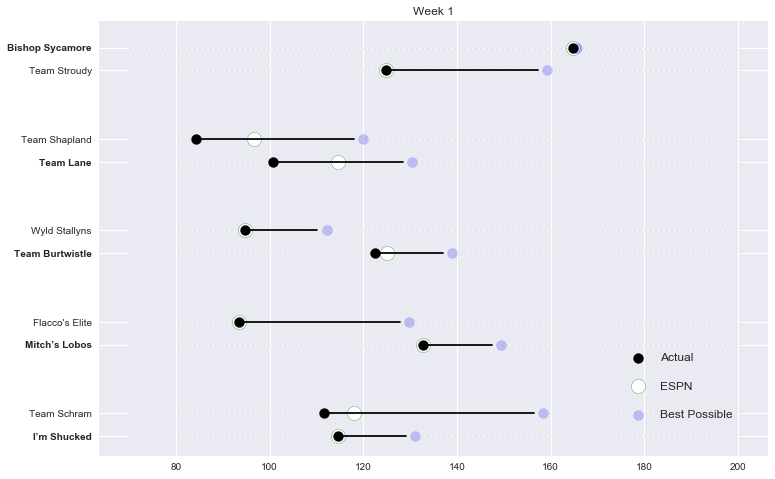

In [27]:
ax = plot_week(d, wdata, week, tms, nummatchups=5)
plt.show()

In [41]:
points_df = pd.DataFrame.from_dict(wdata, orient = 'index').reset_index()
points_df

,index,opts,epts,apts
0,1,129.84,93.38,93.38
1,2,165.62,164.72,164.72
2,4,119.94,96.72,84.22
3,9,130.38,114.62,100.82
4,11,112.16,94.76,94.76
5,12,138.94,125.10,122.60
6,13,159.26,124.96,124.96
7,14,131.10,114.60,114.60
8,15,158.38,117.98,111.68
9,16,149.46,132.86,132.86


In [42]:
teams_df = pd.DataFrame.from_dict(tms, orient = 'index').rename(columns = {0: 'teamName'}).reset_index()
teams_df

,index,teamName
0,1,Flacco's Elite
1,2,Bishop Sycamore
2,4,Team Shapland
3,9,Team Lane
4,11,Wyld Stallyns
5,12,Team Burtwistle
6,13,Team Stroudy
7,14,I’m Shucked
8,15,Team Schram
9,16,Mitch’s Lobos


In [46]:
team_points = pd.merge(points_df, teams_df, on='index')
team_points

,index,opts,epts,apts,teamName
0,1,129.84,93.38,93.38,Flacco's Elite
1,2,165.62,164.72,164.72,Bishop Sycamore
2,4,119.94,96.72,84.22,Team Shapland
3,9,130.38,114.62,100.82,Team Lane
4,11,112.16,94.76,94.76,Wyld Stallyns
5,12,138.94,125.10,122.60,Team Burtwistle
6,13,159.26,124.96,124.96,Team Stroudy
7,14,131.10,114.60,114.60,I’m Shucked
8,15,158.38,117.98,111.68,Team Schram
9,16,149.46,132.86,132.86,Mitch’s Lobos


In [47]:
team_points['delta'] = team_points['opts'] - team_points['apts']
team_points

,index,opts,epts,apts,teamName,delta
0,1,129.84,93.38,93.38,Flacco's Elite,36.46
1,2,165.62,164.72,164.72,Bishop Sycamore,0.90
2,4,119.94,96.72,84.22,Team Shapland,35.72
3,9,130.38,114.62,100.82,Team Lane,29.56
4,11,112.16,94.76,94.76,Wyld Stallyns,17.40
5,12,138.94,125.10,122.60,Team Burtwistle,16.34
6,13,159.26,124.96,124.96,Team Stroudy,34.30
7,14,131.10,114.60,114.60,I’m Shucked,16.50
8,15,158.38,117.98,111.68,Team Schram,46.70
9,16,149.46,132.86,132.86,Mitch’s Lobos,16.60
